# Projet 4: analyse exploratoire

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import missingno as mso
import datetime

In [2]:
pd.set_option("display.max_columns", 50)

# Les différents fichiers

On commence par importer tous les fichiers fournis.

In [3]:
customers = pd.read_csv("olist_customers_dataset.csv")
geolocation = pd.read_csv("olist_geolocation_dataset.csv")
items = pd.read_csv("olist_order_items_dataset.csv")
payments = pd.read_csv("olist_order_payments_dataset.csv")
reviews = pd.read_csv("olist_order_reviews_dataset.csv")
orders = pd.read_csv("olist_orders_dataset.csv")
products = pd.read_csv("olist_products_dataset.csv")
sellers = pd.read_csv("olist_sellers_dataset.csv")
prod_categ_name = pd.read_csv("product_category_name_translation.csv")

Ces différents fichiers constituent une base de données dont la figure ci-dessous rappel les clés permettant de passer d'un fichier à un autre.

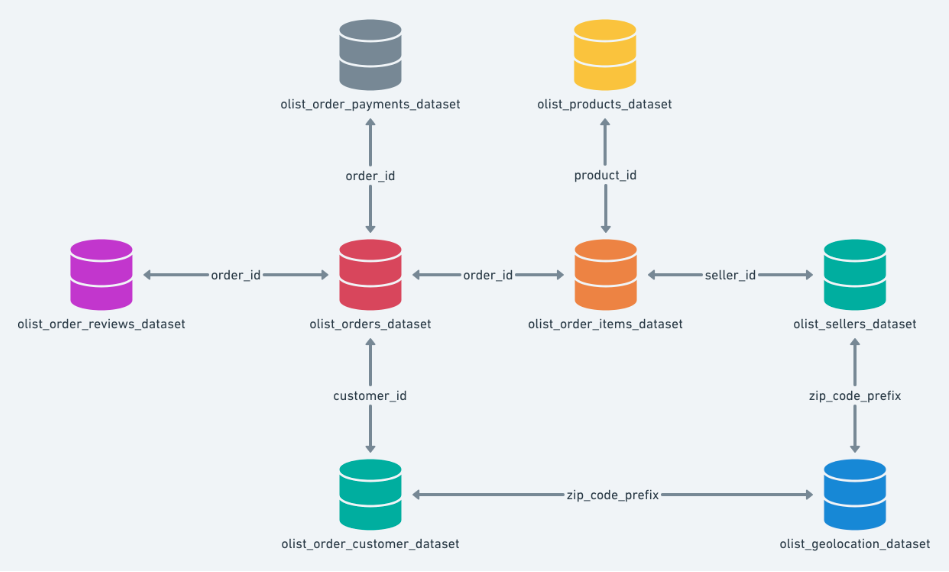

Un point essentiel de ce notebook est de générer un jeu de données qui nous servira à segmenter les clients. On va générer ce jeu de données en regroupant dans un unique dataframe des informations contenues dans les différents fichiers ci-dessus. Plutôt que de regrouper directement tous ces fichiers en un seul dataframe et de faire ensuite le tri entre les informations utiles  ou non, nous allons déjà regarder individuellement chaque fichier et supprimer les informations inutiles. Cela évitera d'avoir un énorme fichier à un moment donné.

Comment différencier les informations utiles, des informations inutiles?

Nous voulons effectuer en premier lieu une segmentation RFM, donc il nous faut absolument la date de la dernière commande, des données permettant de calculer une fréquence de commande, ainsi que le montant des commandes. Par la suite nous essaierons d'améliorer le clustering en ajoutant quelques variables. Le choix de ces variables sera subjectif mais se basera sur une expérience de consommateur.

Passons en revu les différents datasets.

### customers

In [4]:
customers.head(3)

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP


In [5]:
customers.shape

(99441, 5)

<AxesSubplot:xlabel='customer_state', ylabel='count'>

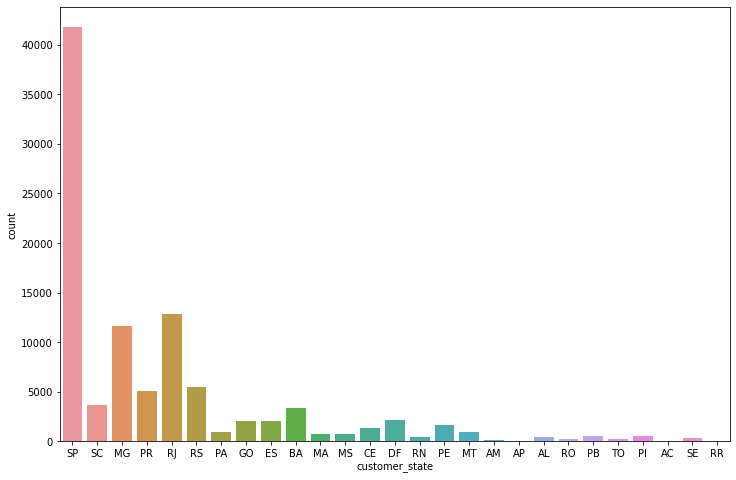

In [6]:
plt.figure(figsize=(12,8))
sns.countplot(x='customer_state', data=customers)

Les clients sont très concentrés dans quelques états, donc on manque d'individus dans la plupart des états et il ne sera pas intéressant d'utiliser cette variable pour le clustering.

### geolocation

In [7]:
geolocation.head(3)

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
0,1037,-23.545621,-46.639292,sao paulo,SP
1,1046,-23.546081,-46.644820,sao paulo,SP
2,1046,-23.546129,-46.642951,sao paulo,SP


In [8]:
geolocation.shape

(1000163, 5)

La ville et l'état de l'acheteur sont déjà spécifiés dans 'customers'. La latitude et la longitude peuvent servir à calculer des distances, mais il y a sans doute des variables plus pertinentes donc nous n'utiliserons pas 'geolocation' pour le clustering. Mais on va quand même utiliser ce dataframe pour visualiser sur une carte l'emplacement des acheteurs. 

In [9]:
# Il y a manifestement des lignes identiques, on supprime les doublons.
geolocation =geolocation.drop_duplicates()

In [10]:
from shapely.geometry import Point
import geopandas as gpd

<AxesSubplot:>

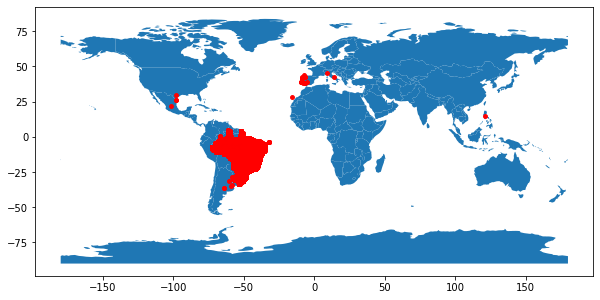

In [11]:
geometry = [Point(xy) for xy in zip(geolocation['geolocation_lng'], geolocation['geolocation_lat'])]
gdf = gpd.GeoDataFrame(geolocation, geometry=geometry)   

world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
gdf.plot(ax=world.plot(figsize=(10, 6)), marker='o', color='red', markersize=15)

Les consommateur sont essentiellement situés au Brézil. 

### Items

In [12]:
items.head(3)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.9,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.0,17.87


In [13]:
items.shape

(112650, 7)

Les variables 'order_item_id', 'price' et 'freight_value' permettent de calculer séparément le cout des produits et les frais de transport, ce qui est plus précis que d'avoir seulemnt le montant total de la commande. On garde donc ces variables, mais pas 'shipping_limit_date'.

In [14]:
items = items.drop(['shipping_limit_date'], axis=1)

Nous allons visualiser les prix et les frais de port à l'aide d'histogrammes. Mais comme ces variables sont très étalées à droite, on regardera leur logarithme.

[Text(0.5, 0, 'ln(1+freight_value)')]

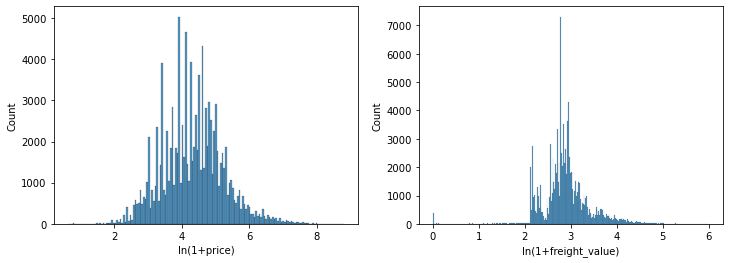

In [15]:
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))
sns.histplot(data=items[['price']].apply(lambda x:np.log(1+x)), x='price', ax=axs[0]).set(xlabel='ln(1+price)')
sns.histplot(data=items[['freight_value']].apply(lambda x:np.log(1+x)), x='freight_value', ax=axs[1]).set(xlabel='ln(1+freight_value)')

In [16]:
# Petit rappel pour lire les deux histogramme ci-dessus.
pd.DataFrame({'x':np.arange(1,9), 'exp(x)':np.exp(np.arange(1,9))}).T

,0,1,2,3,4,5,6,7
x,1.000000,2.000000,3.000000,4.00000,5.000000,6.000000,7.000000,8.000000
exp(x),2.718282,7.389056,20.085537,54.59815,148.413159,403.428793,1096.633158,2980.957987


Regardons maintenant le nombre d'articles par commande. On va faire une classification et tracer un diagramme en barres.

In [17]:
def classification_order_item_id(n):
    if n == 1:
        return '1'
    elif n <= 3:
        return '2 ou 3'
    elif n <= 6:
        return '4 à 6'
    elif n <= 12:
        return '7 à 12'
    else :
        return '13 et +'

[Text(0.5, 1.0, "Nombre d'article par commande")]

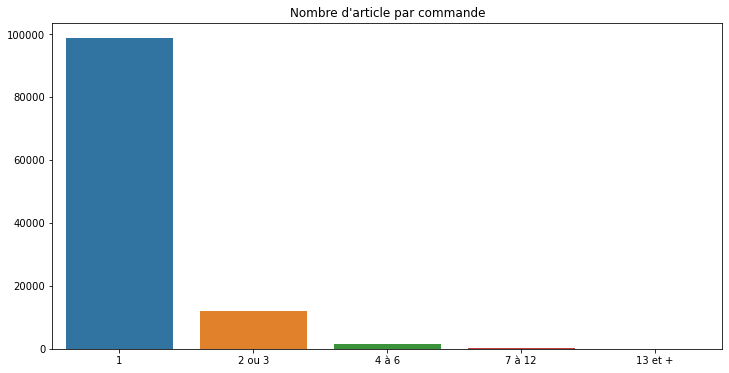

In [18]:
plt.figure(figsize=(12, 6))
comptage = items['order_item_id'].apply(classification_order_item_id).value_counts()
sns.barplot(x=comptage.index, y=comptage.values).set(title='Nombre d\'article par commande')

Les clients ne commandent bien souvent qu'un seul article, donc l'ajout de cette variable pour le clustering n'est pas pertinente.

### Payments

In [19]:
payments.head(3)

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71


In [20]:
payments.shape

(103886, 5)

[Text(0.5, 1.0, 'payment_type')]

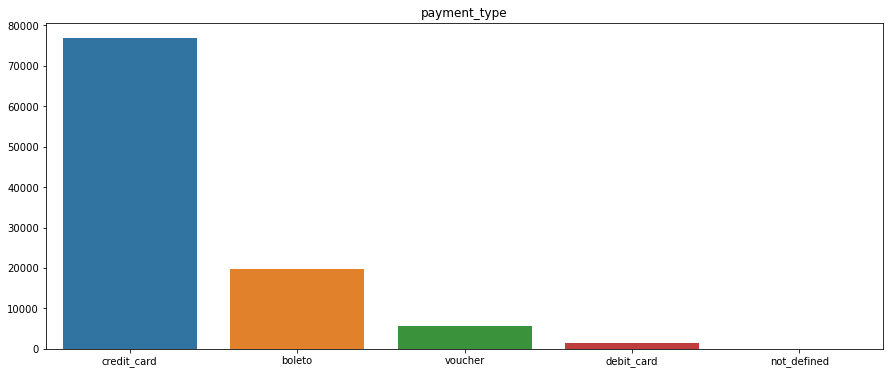

In [21]:
plt.figure(figsize=(15,6))
comptage = payments['payment_type'].value_counts()
sns.barplot(x=comptage.index, y=comptage.values).set(title='payment_type')

C'est un peu plus équilibré que pour 'order_item_id' mais il s'agit d'une variable catégorielle non ordonnée donc il faudrait l'encoder pour le clustering, ce qui aura pour effet d'augmenter la dimension, ce qui est mauvais pour le clustering, alors que les clients paient surtout par carte de crédit. Nous n'utiliserons pas cette variable.

Passons au nombre de paiments effectués pour une commande.

In [22]:
def classification_payment_sequential(n):
    if n == 1:
        return '1'
    elif n <= 4:
        return '2 à 4'
    elif n <= 10:
        return '5 à 10'
    else :
        return '11 et +'

[Text(0.5, 1.0, 'payment_sequential')]

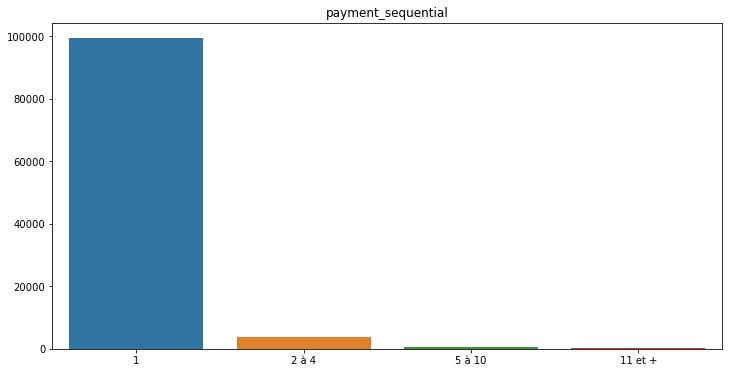

In [23]:
plt.figure(figsize=(12, 6))
comptage = payments['payment_sequential'].apply(classification_payment_sequential).value_counts()
sns.barplot(x=comptage.index, y=comptage.values).set(title='payment_sequential')

Même remarque que pour 'oreder_item_id'.

### Reviews

In [24]:
reviews.head(3)

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24


In [25]:
reviews.shape

(99224, 7)

Il y a manifestement des valeurs manquantes, regardons ça à l'aide de missingno.

<AxesSubplot:>

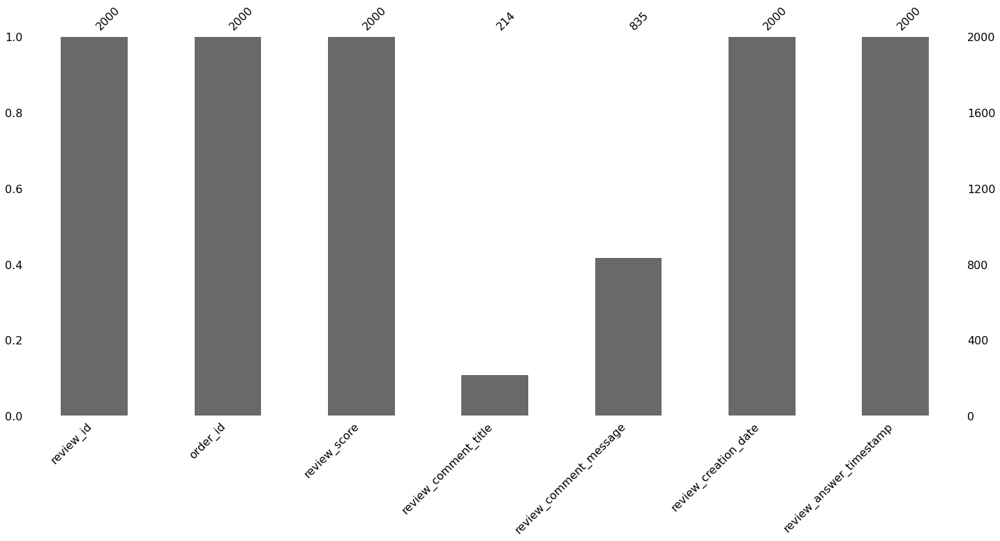

In [26]:
mso.bar(reviews.sample(2000))

On supprime les deux colonnes peu remplies, ainsi que les dates. Ce qui revient à ne garder que les 3 premières colonnes.

In [27]:
reviews = reviews[['review_id','order_id', 'review_score']]

[Text(0.5, 1.0, 'review_score')]

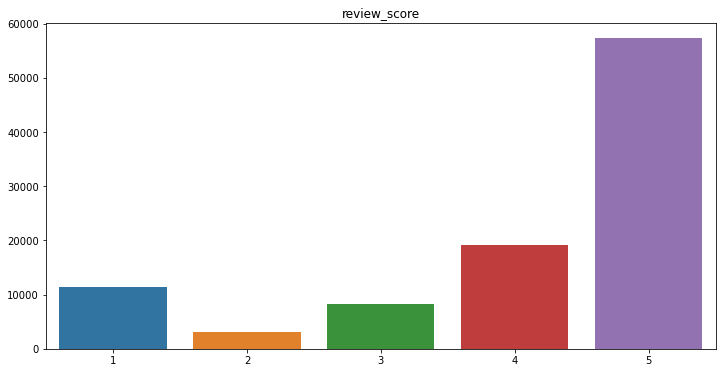

In [28]:
plt.figure(figsize=(12, 6))
comptage = reviews['review_score'].value_counts()
sns.barplot(x=comptage.index, y=comptage.values).set(title='review_score')

Contrairement à 'payment_sequential' ou 'order_item_id', on a peut-être suffisament d'individus dans chaque classe. Et compte tenu du lien qu'on peut imaginer entre la satisfaction d'un client et sa fidélité, on pourra utiliser cette variable pour le clustering.

### orders

In [29]:
orders.head(3)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00


In [30]:
orders.shape

(99441, 8)

[Text(0.5, 1.0, 'order_status')]

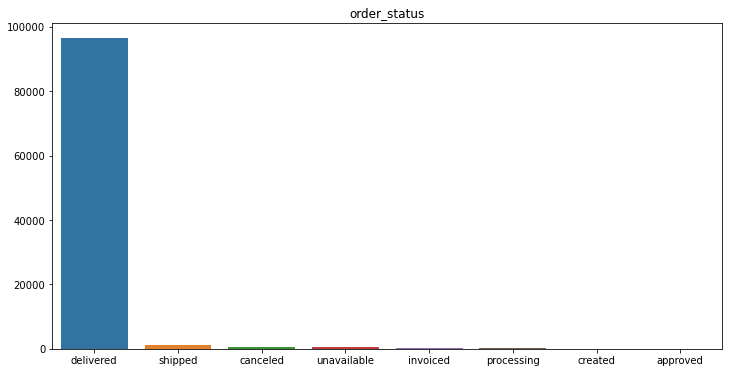

In [31]:
plt.figure(figsize=(12, 6))
comptage = orders['order_status'].value_counts()
sns.barplot(x=comptage.index, y=comptage.values).set(title='order_status')

Quasiment toutes les commandes ont été livrées. On ne va pas prendre en compte les commandes qui ont été annulée puisqu'elles ne représentent pas un "client". Mais on ne va pas supprimer des lignes avant d'utiliser la fonction merge parce que des clés risque de ne renvoyer sur rien et on aura des valeurs manquantes.

Ce dataframe contient essentiellement des dates. Pour la segmentation RFM nous avons besoin de la date à laquelle une commande est passée, et il pourrai être intéressant de voir le temps écoulé (en jours) entre la commande et la réception.

In [32]:
# Vérification des types
orders.dtypes

order_id                         object
customer_id                      object
order_status                     object
order_purchase_timestamp         object
order_approved_at                object
order_delivered_carrier_date     object
order_delivered_customer_date    object
order_estimated_delivery_date    object
dtype: object

Il faut donc faire une convertion de nos dates utiles en objet 'date'.

In [33]:
orders['order_purchase_timestamp'] = pd.to_datetime(orders['order_purchase_timestamp'])
orders['order_estimated_delivery_date'] = pd.to_datetime(orders['order_estimated_delivery_date'])
orders['order_delivered_customer_date'] = pd.to_datetime(orders['order_delivered_customer_date'])

In [34]:
orders['ecart_prediction_reception'] = (orders['order_delivered_customer_date'] - orders['order_estimated_delivery_date']).dt.days

In [35]:
orders = orders.drop(['order_approved_at', 'order_delivered_carrier_date',
                      'order_delivered_customer_date', 'order_estimated_delivery_date'], axis=1)

On va séparer les jours, mois, année de la date de commande dans de nouvelles variables. Mais avant inversons deux colonnes.

In [36]:
orders = orders.reindex(columns=['order_id', 'customer_id', 'order_status', 'ecart_prediction_reception', 'order_purchase_timestamp'])

In [37]:
orders['ans'] = orders['order_purchase_timestamp'].dt.year
orders['mois'] = orders['order_purchase_timestamp'].dt.month
orders['jours'] = orders['order_purchase_timestamp'].dt.day
orders['jours_semaine'] = orders['order_purchase_timestamp'].dt.weekday
orders['order_purchase_timestamp'] = orders['order_purchase_timestamp'].dt.date
orders.rename(columns={'order_purchase_timestamp':'order_purchase_date'}, inplace=True)
orders.head(3)

,order_id,customer_id,order_status,ecart_prediction_reception,order_purchase_date,ans,mois,jours,jours_semaine
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,-8.0,2017-10-02,2017,10,2,0
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,-6.0,2018-07-24,2018,7,24,1
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,-18.0,2018-08-08,2018,8,8,2


[Text(0.5, 1.0, 'année')]

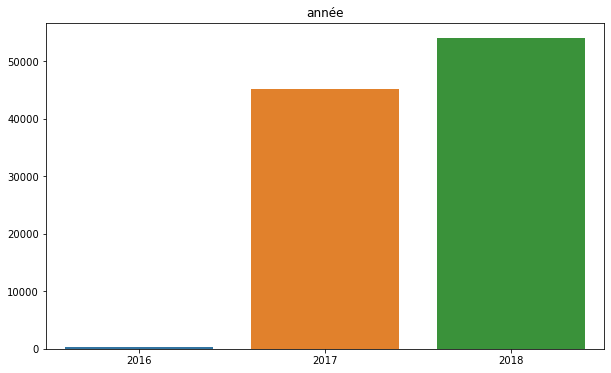

In [38]:
plt.figure(figsize=(10,6))
comptage = orders['ans'].value_counts()
sns.barplot(x=comptage.index, y=comptage.values).set(title='année')

Les données concerent donc essentiellemnt deux années: 2017 et 2018.

On va maintenant regarder l'évolution des ventes au cours de ces deux années.

Text(0, 0.5, 'Quantité')

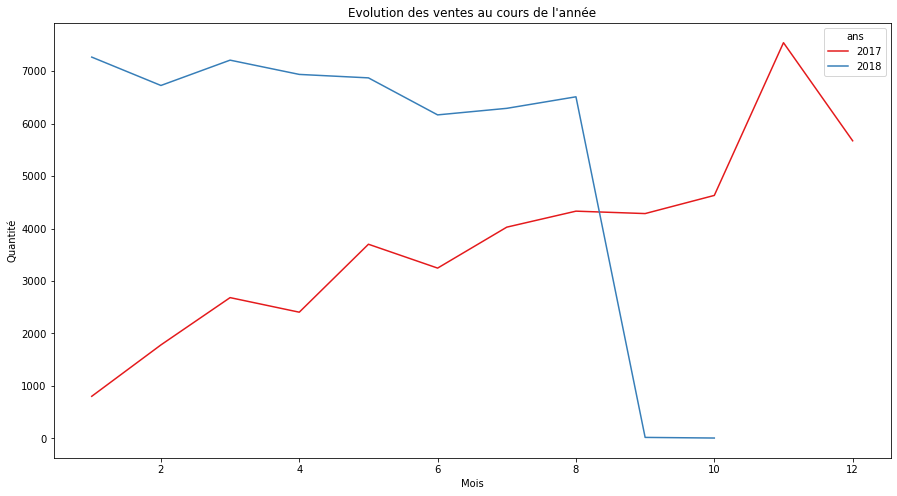

In [39]:
# On va retirer les ventes de 2016 car il ya peu de données.
sans_2016 = orders['ans'].isin([2017, 2018])

plt.figure(figsize=(15, 8))
ventes_annuelles = orders[sans_2016].groupby(['mois', 'ans'])['order_id'].nunique().reset_index()

sns.lineplot(data = ventes_annuelles, x='mois', y='order_id', hue='ans', palette='Set1')
plt.title('Evolution des ventes au cours de l\'année')
plt.xlabel('Mois')
plt.ylabel('Quantité')

Les ventes on plutôt bien progressés, il ne faut pas tenir compte de la chute au 8ème mois: c'est juste que le jeu de donnée s'arrête là.

### Products

In [40]:
products.head(3)

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0


In [41]:
products.shape

(32951, 9)

Les mesure sont là surtout pour calculer les frais de transport, que nous avons déjà. On ne garde donc que 'product_category_name'.

In [42]:
products = products[['product_id', 'product_category_name']]

### Sellers

In [43]:
sellers.head(3)

,seller_id,seller_zip_code_prefix,seller_city,seller_state
0,3442f8959a84dea7ee197c632cb2df15,13023,campinas,SP
1,d1b65fc7debc3361ea86b5f14c68d2e2,13844,mogi guacu,SP
2,ce3ad9de960102d0677a81f5d0bb7b2d,20031,rio de janeiro,RJ


In [44]:
sellers.shape

(3095, 4)

<AxesSubplot:xlabel='seller_state', ylabel='count'>

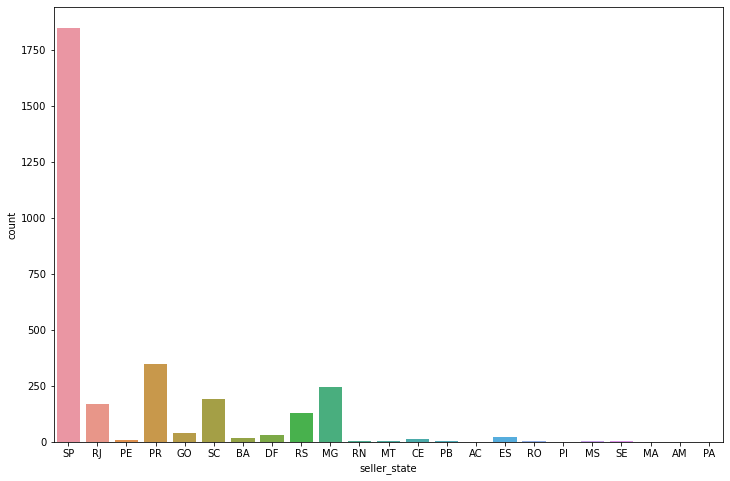

In [45]:
plt.figure(figsize=(12,8))
sns.countplot(x='seller_state', data=sellers)

Même remarque que pour 'customer_state'. Par contre on pourra éventuellement créer une nouvelle variable indiquant si le vendeur et l'acheteur se trouvent dans le même état.

### product_categ_name

In [46]:
prod_categ_name.head(3)

,product_category_name,product_category_name_english
0,beleza_saude,health_beauty
1,informatica_acessorios,computers_accessories
2,automotivo,auto


In [47]:
prod_categ_name.shape

(71, 2)

Il s'agit juste de la traduction en anglais des catégories de produits. On garde ce fichier de coté, on l'utilisera si besoin.

# Merge des données

On regroupe nos différent fichiers.

In [48]:
data = pd.merge(customers, orders, on = "customer_id", how = "left")
data = pd.merge(data, reviews, on = "order_id", how = "left")
data = pd.merge(data, payments, on = "order_id", how = "left")
data = pd.merge(data, items, on = "order_id", how = "left")
data = pd.merge(data, products, on = "product_id", how = "left")
data = pd.merge(data, sellers, on = "seller_id", how = "left")

In [49]:
data

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,ecart_prediction_reception,order_purchase_date,ans,mois,jours,jours_semaine,review_id,review_score,payment_sequential,payment_type,payment_installments,payment_value,order_item_id,product_id,seller_id,price,freight_value,product_category_name,seller_zip_code_prefix,seller_city,seller_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,-11.0,2017-05-16,2017,5,16,1,88b8b52d46df026a9d1ad2136a59b30b,4.0,1.0,credit_card,2.0,146.87,1.0,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,124.99,21.88,moveis_escritorio,8577.0,itaquaquecetuba,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,delivered,-8.0,2018-01-12,2018,1,12,4,02fc48a9efa3e3d0f1a8ea26507eeec3,5.0,1.0,credit_card,8.0,335.48,1.0,4aa6014eceb682077f9dc4bffebc05b0,b8bc237ba3788b23da09c0f1f3a3288c,289.00,46.48,utilidades_domesticas,88303.0,itajai,SC
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,delivered,1.0,2018-05-19,2018,5,19,5,5ad6695d76ee186dc473c42706984d87,5.0,1.0,credit_card,7.0,157.73,1.0,bd07b66896d6f1494f5b86251848ced7,7c67e1448b00f6e969d365cea6b010ab,139.94,17.79,moveis_escritorio,8577.0,itaquaquecetuba,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,951670f92359f4fe4a63112aa7306eba,delivered,-13.0,2018-03-13,2018,3,13,1,059a801bb31f6aab2266e672cab87bc5,5.0,1.0,credit_card,1.0,173.30,1.0,a5647c44af977b148e0a3a4751a09e2e,7c67e1448b00f6e969d365cea6b010ab,149.94,23.36,moveis_escritorio,8577.0,itaquaquecetuba,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,delivered,-6.0,2018-07-29,2018,7,29,6,8490879d58d6c5d7773f2739a03f089a,5.0,1.0,credit_card,8.0,252.25,1.0,9391a573abe00141c56e38d84d7d5b3b,4a3ca9315b744ce9f8e9374361493884,230.00,22.25,casa_conforto,14940.0,ibitinga,SP
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119138,17ddf5dd5d51696bb3d7c6291687be6f,1a29b476fee25c95fbafc67c5ac95cf8,3937,sao paulo,SP,6760e20addcf0121e9d58f2f1ff14298,delivered,-12.0,2018-04-07,2018,4,7,5,36e2cdbaa9f639b57c53b37ac798fee8,4.0,1.0,credit_card,6.0,88.78,1.0,ccb4503d9d43d245d3b295d0544f988b,527801b552d0077ffd170872eb49683b,74.90,13.88,livros_interesse_geral,17400.0,garca,SP
119139,e7b71a9017aa05c9a7fd292d714858e8,d52a67c98be1cf6a5c84435bd38d095d,6764,taboao da serra,SP,9ec0c8947d973db4f4e8dcf1fbfa8f1b,delivered,-9.0,2018-04-04,2018,4,4,2,b273b431c3aedb4eed18643309652940,5.0,1.0,credit_card,3.0,129.06,1.0,9ede6b0570a75a4b9de4f383329f99ee,3fd1e727ba94cfe122d165e176ce7967,114.90,14.16,esporte_lazer,14802.0,araraquara,SP
119140,5e28dfe12db7fb50a4b2f691faecea5e,e9f50caf99f032f0bf3c55141f019d99,60115,fortaleza,CE,fed4434add09a6f332ea398efd656a5c,delivered,7.0,2018-04-08,2018,4,8,6,fa4f16891e6b2edd1354668d07f5648b,1.0,1.0,credit_card,5.0,56.04,1.0,7a5d2e1e131a860ae7d18f6fffa9d689,d9e7e7778b32987280a6f2cb9a39c57d,37.00,19.04,beleza_saude,3304.0,sao paulo,SP
119141,56b18e2166679b8a959d72dd06da27f9,73c2643a0a458b49f58cea58833b192e,92120,canoas,RS,e31ec91cea1ecf97797787471f98a8c2,delivered,-19.0,2017-11-03,2017,11,3,4,0bcdc9e450ea500811a8d39ee993cd47,5.0,1.0,credit_card,2.0,711.07,1.0,f819f0c84a64f02d3a5606ca95edd272,4869f7a5dfa277a7dca6462dcf3b52b2,689.00,22.07,relogios_presentes,14840.0,guariba,SP


In [50]:
# On supprime les clés qui nous sont dorénavant inutiles.
del_colonne = ['customer_zip_code_prefix', 'seller_zip_code_prefix', 'review_id']
data = data.drop(del_colonne, axis = 1)

In [51]:
# On supprime les doublons.
data = data.drop_duplicates()
data.shape

(118722, 25)

In [52]:
# On supprime les commandes qui ont été annulées.
data = data[data['order_status'] != 'canceled']

Vérifions s'il manque des valeurs.

In [53]:
liste_nan = [data[c].isna().sum() for c in list(data.columns)]
pd.DataFrame(liste_nan, index=list(data.columns), columns=['Nombre_de_nan'])

,Nombre_de_nan
customer_id,0
customer_unique_id,0
customer_city,0
customer_state,0
order_id,0
order_status,0
ecart_prediction_reception,2672
order_purchase_date,0
ans,0
mois,0


Pour certaine variables, les valeurs manquantes ne sont pas un problème puisqu'on ne les utilisera pas. Mais pour la segmentation RFM on a besoin du montant dépensé par le client. Ce montant peut être interprété de deux manières: soit il s'agit de la somme d'argent dépensé par le client (frais de port inclus), et dans ce cas il s'agit de la somme des 'payment_value' relatif à un même 'customer_unique_id', soit on ne prends pas en compte les frais de port et alors il s'agit de la somme des 'price' relatifs à un même 'customer_unique_id'. Pour rester proche du chiffre d'affaire d'Olist lié à ces ventes, on va plutôt utiliser la variable 'price'. Or il nous manque queqlues valeurs.

Comparons 'payment_value' et 'price' pour quelques commandes.

In [54]:
data[['payment_value', 'price']].head(10)

,payment_value,price
0,146.87,124.99
1,335.48,289.00
2,157.73,139.94
3,173.30,149.94
4,252.25,230.00
5,282.21,259.90
6,22.77,14.99
7,36.01,19.90
8,39.10,25.00
9,122.47,99.90


Les frais de ports ne sont pas liés au prix d'un objet mais à ses dimensions donc on ne peut pas déduire 'price' à partir de 'payment_value'. Mais les deux restent quand même assez proche.

On va partir sur une estimation des frais de port  égale à 10% de 'price'. On complète alors les valeurs manquantes.

In [55]:
data['price'] = data['price'].fillna(data['payment_value'].apply(lambda x: x / 1.1))

On crée un fichier csv à partir de ce dataframe pour le conserver.

In [56]:
data.to_csv('olist_merge_data.csv', index=False)

# Création du fichier pour la segmentation RFM

A partir du dataframe précédent on va créer le fichier qu'il nous faut pour la segmentation RFM, avec seulement les trois variable de base de la segmentation RFM.

In [57]:
# Il nous faut une date de référence pour la variable 'recent'.
max_date = max(data['order_purchase_date']) + datetime.timedelta(days=1)
max_date

datetime.date(2018, 9, 4)

In [58]:
data_rfm = data.groupby(['customer_unique_id']) # On regroupe les commandes par client.
data_rfm = data_rfm.agg({
            'order_purchase_date': lambda x: (max_date - x.max()).days, # 'recent'
            'customer_id':'count',                                      # 'frequence'
            'price':'sum'}).reset_index()                               # 'montant'

In [59]:
data_rfm.columns = ['customer_unique_id', 'recent', 'frequence', 'montant']
data_rfm

,customer_unique_id,recent,frequence,montant
0,0000366f3b9a7992bf8c76cfdf3221e2,117,1,129.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,120,1,18.90
2,0000f46a3911fa3c0805444483337064,543,1,69.00
3,0000f6ccb0745a6a4b88665a16c9f078,327,1,25.99
4,0004aac84e0df4da2b147fca70cf8255,294,1,180.00
...,...,...,...,...
95555,fffcf5a5ff07b0908bd4e2dbc735a684,453,2,1570.00
95556,fffea47cd6d3cc0a88bd621562a9d061,268,1,64.89
95557,ffff371b4d645b6ecea244b27531430a,574,1,89.90
95558,ffff5962728ec6157033ef9805bacc48,125,1,115.00


Analysons ces trois variables.

On peut les visualiser sur un graphe en 3D.

In [60]:
px.scatter_3d(data_rfm, x='frequence', y='recent', z='montant')

In [61]:
data_rfm.describe()

,recent,frequence,montant
count,95560.000000,95560.000000,95560.000000
mean,244.935705,1.234575,149.090286
std,153.126881,0.835637,247.860723
min,1.000000,1.000000,0.850000
25%,121.000000,1.000000,48.900000
50%,226.000000,1.000000,89.900000
75%,354.000000,1.000000,159.900000
max,730.000000,75.000000,13440.000000


In [62]:
data_rfm[data_rfm['frequence']!=1].shape

(14324, 4)

La plupart des clients n'ont en fait réalisé qu'une seule commande.

In [63]:
def classification_frequence(n):
    if n == 1:
        return '1'
    elif n <= 3:
        return '2 ou 3'
    else :
        return '4 et +'

[Text(0.5, 1.0, 'frequence')]

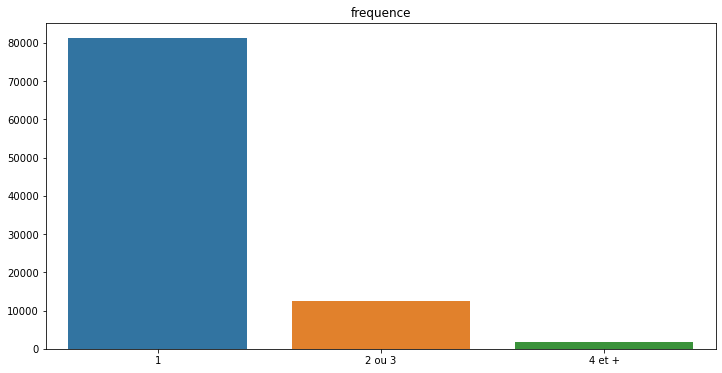

In [64]:
plt.figure(figsize=(12, 6))
comptage = data_rfm['frequence'].apply(classification_frequence).value_counts()
sns.barplot(x=comptage.index, y=comptage.values).set(title='frequence')

<AxesSubplot:xlabel='recent', ylabel='Count'>

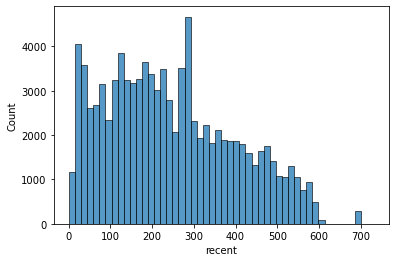

In [65]:
sns.histplot(data=data_rfm, x='recent', bins=50)

[Text(0.5, 0, 'ln(1+montant)')]

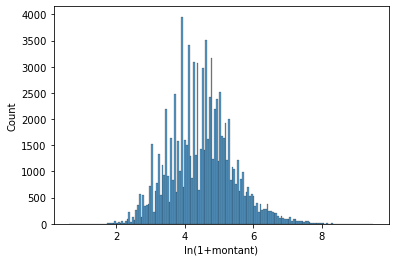

In [66]:
sns.histplot(data=data_rfm[['montant']].apply(lambda x:np.log(1+x)), x='montant').set(xlabel='ln(1+montant)')

In [67]:
data_rfm[['recent', 'frequence', 'montant']].corr()

,recent,frequence,montant
recent,1.000000,0.004625,0.006915
frequence,0.004625,1.000000,0.280675
montant,0.006915,0.280675,1.000000


In [68]:
data_rfm.to_csv("data_rfm.csv", index=False)

# Ajout de variables

Par rapport au jeu de donnée data_rfm, nous allons ajouter 'review_score' ainsi qu'une variable indiquant si le vendeur et l'acheteur se trouvent dans le même état.

In [69]:
data_rfm_plus = data[['customer_id', 'customer_unique_id', 'order_purchase_date', 'price', 'review_score',
                     'customer_state', 'seller_state']]

On remplace les valeurs manquantes de 'seller_state' par 'inconnu' avant de regrouper les données par 'customer_unique_id' pour éviter une erreur.

In [70]:
data_rfm_plus['seller_state'] = data_rfm_plus['seller_state'].fillna('inconnu')

C:\Users\tony.mathieux\AppData\Local\Temp\ipykernel_56572\296783276.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



On regroupe les données.

In [71]:
data_rfm_plus = data_rfm_plus.groupby(['customer_unique_id'])
data_rfm_plus = data_rfm_plus.agg({
            'order_purchase_date': lambda x: (max_date - x.max()).days,
            'customer_id':'count',
            'price':'sum',
            'review_score':'mean',
            'customer_state': lambda x: x.value_counts().index[0],
            'seller_state': lambda x: x.value_counts().index[0]}).reset_index()
data_rfm_plus.columns = ['customer_unique_id', 'recent', 'frequence', 'montant', 'note_moyenne',
                         'customer_state', 'seller_state']
data_rfm_plus

,customer_unique_id,recent,frequence,montant,note_moyenne,customer_state,seller_state
0,0000366f3b9a7992bf8c76cfdf3221e2,117,1,129.90,5.0,SP,SP
1,0000b849f77a49e4a4ce2b2a4ca5be3f,120,1,18.90,4.0,SP,SP
2,0000f46a3911fa3c0805444483337064,543,1,69.00,3.0,SC,SP
3,0000f6ccb0745a6a4b88665a16c9f078,327,1,25.99,4.0,PA,SP
4,0004aac84e0df4da2b147fca70cf8255,294,1,180.00,5.0,SP,SP
...,...,...,...,...,...,...,...
95555,fffcf5a5ff07b0908bd4e2dbc735a684,453,2,1570.00,5.0,PE,SP
95556,fffea47cd6d3cc0a88bd621562a9d061,268,1,64.89,4.0,BA,SP
95557,ffff371b4d645b6ecea244b27531430a,574,1,89.90,5.0,MT,MG
95558,ffff5962728ec6157033ef9805bacc48,125,1,115.00,5.0,ES,SP


On vérifie s'il manque des valeurs.

In [72]:
liste_nan = [data_rfm_plus[c].isna().sum() for c in list(data_rfm_plus.columns)]
pd.DataFrame(liste_nan, index=list(data_rfm_plus.columns), columns=['Nombre_de_nan'])

,Nombre_de_nan
customer_unique_id,0
recent,0
frequence,0
montant,0
note_moyenne,698
customer_state,0
seller_state,0


On remplace les valeurs manquantes par la moyenne des autres.

In [73]:
data_rfm_plus['note_moyenne'] = data_rfm_plus['note_moyenne'].fillna(data_rfm_plus['note_moyenne'].mean())

Maintenant on remplace les variables 'customer_state' et 'seller_state' par une variable indiquant si le vendeur et l'acheteur se trouvent dans le même état.

In [74]:
data_rfm_plus['customer_state==seller_state'] = data_rfm_plus.apply(lambda x:x.customer_state == x.seller_state, axis=1)
data_rfm_plus['customer_state==seller_state'] = data_rfm_plus['customer_state==seller_state'].apply(lambda x: int(x))

data_rfm_plus = data_rfm_plus.drop(['customer_state', 'seller_state'], axis=1)

In [75]:
data_rfm_plus.to_csv("data_rfm_plus.csv", index=False)

Nous avons 5 variables, mais nous ne pouvons pas tracer un graphe en 5D. Par contre on peut voir la répartition des notes par rapport aux variables RFM via une coloration des points. 

In [76]:
px.scatter_3d(data_rfm_plus, x='frequence', y='recent', z='montant', color='note_moyenne')

On ne voit pas de schéma particulier.

Nous allons terminer par une analyse en composantes principales de ces données.

### ACP

In [77]:
from sklearn import preprocessing, decomposition
from functions import *

In [78]:
X = data_rfm_plus[['recent', 'frequence', 'montant', 'note_moyenne', 'customer_state==seller_state']]

In [79]:
std_scaled = preprocessing.StandardScaler().fit(X.values)
X_scaled = std_scaled.transform(X.values)

In [80]:
pca = decomposition.PCA(n_components=5)
pca.fit(X_scaled)

PCA(n_components=5)

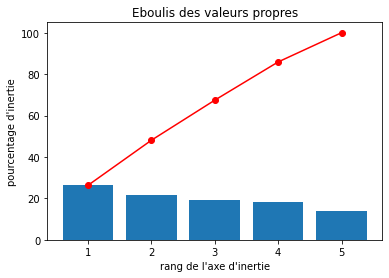

In [81]:
display_scree_plot(pca)

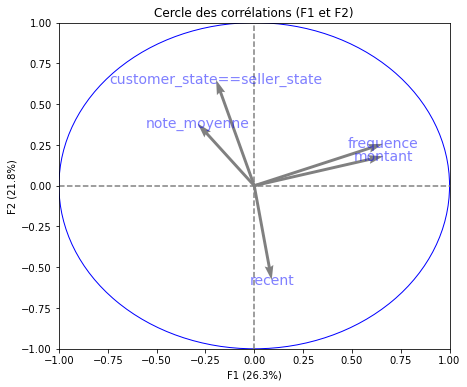

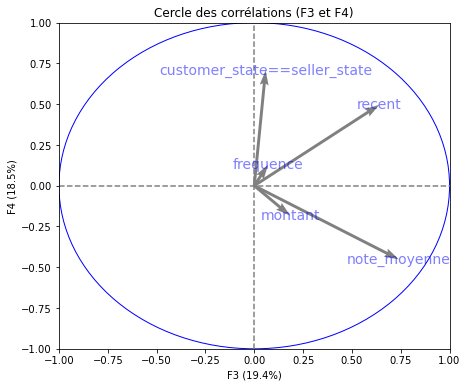

In [82]:
display_circles(pca.components_, 8, pca, [(0,1),(2,3)], labels=np.array(X.columns))